In [747]:
%matplotlib inline

import pandas as pd
import itertools
import yfinance as yf
import matplotlib.pyplot as plt

import plotly.graph_objects as go
import plotly_express as px

from IPython.display import display, Markdown, HTML
import numpy as np
from matplotlib.dates import date2num , DateFormatter

from statsmodels.tsa.stattools import grangercausalitytests
from sklearn import preprocessing

from sklearn.naive_bayes import GaussianNB
import seaborn as sns; sns.set()
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor

import os

In [2]:
df2 = pd.read_csv('Data/temp_datalab_records_linkedin_company.csv')

/opt/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning: Columns (9,10) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [206]:
len(df2.company_name.unique())

4955

In [5]:
df2['date_added'] = pd.to_datetime(df2['date_added'])

In [6]:
len(df2['company_name'][df2['employees_on_platform']==0].unique())

102

In [7]:
# We drop companies that have 0 employees at any point in time

df2.drop(df2[df2['employees_on_platform']==0].index, inplace=True)

In [8]:
df2

,dataset_id,as_of_date,company_name,followers_count,employees_on_platform,link,industry,date_added,date_updated,description,website,entity_id,cusip,isin
0,58329,2015-09-14,Goldman Sachs,552254,38124,https://www.linkedin.com/company/1382,Investment Banking,2015-09-14 00:00:00+00:00,2015-09-14 00:00:00+00,NaN,NaN,NaN,NaN,NaN
1,58329,2015-09-15,Goldman Sachs,552862,38141,https://www.linkedin.com/company/1382,Investment Banking,2015-09-15 00:00:00+00:00,2015-09-15 00:00:00+00,NaN,NaN,NaN,NaN,NaN
2,58363,2015-09-16,United Technologies,59157,14982,https://www.linkedin.com/company/2426,Aviation & Aerospace,2015-09-16 00:00:00+00:00,2015-09-16 00:00:00+00,NaN,NaN,NaN,NaN,NaN
3,58366,2015-09-16,Novo Nordisk,336175,26448,https://www.linkedin.com/company/2227,Pharmaceuticals,2015-09-16 00:00:00+00:00,2015-09-16 00:00:00+00,NaN,NaN,NaN,NaN,NaN
4,58371,2015-09-16,"Lowe's Companies, Inc.",134255,62574,https://www.linkedin.com/company/4128,Retail,2015-09-16 00:00:00+00:00,2015-09-16 00:00:00+00,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2426191,902985,2018-07-17,"Diversified Restaurant Holdings, Inc (Nasdaq: ...",488,89,https://www.linkedin.com/company/428083,Restaurants,2018-07-17 17:17:08.889700+00:00,2018-07-17 17:17:08.889725+00,NaN,http://www.diversifiedrestaurantholdings.com,NaN,NaN,NaN
2426192,903052,2018-07-17,First Financial Northwest Bank,785,118,https://www.linkedin.com/company/497673,Banking,2018-07-17 15:54:35.807059+00:00,2018-07-17 15:54:35.807085+00,NaN,http://www.ffnwb.com,NaN,NaN,NaN
2426193,902948,2018-07-17,DMC Global Inc.,1521,184,https://www.linkedin.com/company/586890,Oil & Energy,2018-07-17 13:44:19.302482+00:00,2018-07-17 13:44:19.302508+00,NaN,http://www.dmcglobal.com,NaN,NaN,NaN
2426194,910210,2018-07-17,ServiceSource,27963,2496,https://www.linkedin.com/company/11889,Information Technology and Services,2018-07-17 17:28:48.430667+00:00,2018-07-17 17:28:48.430717+00,NaN,http://www.servicesource.com,NaN,NaN,NaN


In [9]:
# We look at the number of employees at the earliest time and at the latest

df_latest = df2.loc[df2.groupby('dataset_id').date_added.idxmax()]
df_earliest = df2.loc[df2.groupby('dataset_id').date_added.idxmin()]

In [10]:
df_latest = df_latest.merge(df_earliest[['dataset_id', 'employees_on_platform']], suffixes=['_latest', '_earliest'], on='dataset_id')

In [11]:
df_latest['employees_ratio'] = df_latest['employees_on_platform_latest']/df_latest['employees_on_platform_earliest']

In [12]:
#Latest number of followers

fig = go.Figure()
fig.add_trace(go.Histogram(x=df_latest['employees_on_platform_latest'], nbinsx=100))

fig.show()
#plt.hist(df_latest['employees_on_platform_latest'], bins=300)
#plt.xlim(0,40000);

In [13]:
# Examine the bin between 0 and 10k employees

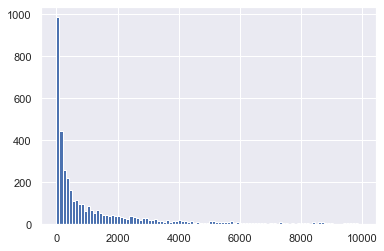

In [14]:
plt.hist(df_latest['employees_on_platform_latest'][df_latest['employees_on_platform_latest']<10000], bins=100);
#plt.xlim(0,10000);

In [15]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=df_latest['employees_ratio'], nbinsx=100))

fig.show()

#plt.hist(df_latest['employees_ratio'], bins=100);

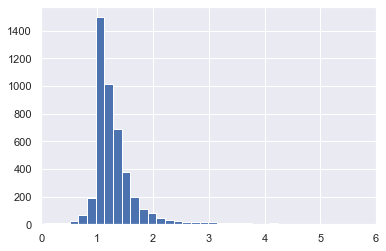

In [16]:
plt.hist(df_latest['employees_ratio'], bins=300)
plt.xlim(0,6);

In [17]:
df_latest['industry'][pd.isnull(df_latest['industry'])] = ''

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [18]:
industries = df_latest['industry'].unique()
for industry in industries:
    aux = df_latest['employees_ratio'][df_latest['industry']==industry]
    if len(aux)>100:
        print(industry+": ", len(aux), " - ", np.mean(aux))

Financial Services:  260  -  1.4553410704428285
Computer Software:  166  -  1.2845172899907995
Pharmaceuticals:  175  -  1.3354863970280841
Electrical/Electronic Manufacturing:  107  -  1.7370270767652098
Biotechnology:  310  -  1.3904542562066455
Retail:  156  -  1.518242492903392
Information Technology and Services:  174  -  1.2260582985167168
Oil & Energy:  217  -  1.35780039751991
Telecommunications:  120  -  1.3635540561572
Medical Devices:  120  -  1.3021496007438347
Banking:  313  -  1.3175739777226663
Internet:  144  -  1.4801183825753725
Insurance:  104  -  1.3276159925352577
Semiconductors:  102  -  1.2437516707190175
Real Estate:  143  -  1.289229153637651


In [19]:
fig = go.Figure()
for industry in industries:
    aux = df_latest['employees_ratio'][df_latest['industry']==industry]
    if len(aux)>150:
        print(industry+": ", len(aux), " - ", np.mean(aux))
        fig.add_trace(go.Histogram(x=aux, histnorm='probability', name=industry))
fig.show()

Financial Services:  260  -  1.4553410704428285
Computer Software:  166  -  1.2845172899907995
Pharmaceuticals:  175  -  1.3354863970280841
Biotechnology:  310  -  1.3904542562066455
Retail:  156  -  1.518242492903392
Information Technology and Services:  174  -  1.2260582985167168
Oil & Energy:  217  -  1.35780039751991
Banking:  313  -  1.3175739777226663


In [20]:
# When zooming in it's interesting to see that areas such as IT and computer services have grown at a slower rate than banking or retail.

In [21]:
fig = px.scatter(x=df_latest['employees_ratio'], 
                 y=df_latest['employees_on_platform_earliest'],
                hover_name=df_latest["company_name"], color=df_latest['industry'] , color_continuous_scale="Viridis")#)
fig.update_layout(xaxis = go.layout.XAxis(title_text = "Employees Ratio"),
                  yaxis = go.layout.YAxis(title_text = "Number of Employees (latest)"))
fig.show()
# When checking with pyplot we can see the different categories
#plt.scatter(x=df_latest['employees_ratio'], y=df_latest['employees_on_platform_earliest']);

In [22]:
# We are going to look at a few stocks. 
# We first find the 10 stocks with the highest number of employees according to their latest data

top10 = df_latest.sort_values(by='employees_on_platform_latest').tail(10)
df_ordered = df_latest.sort_values(by='employees_on_platform_latest')
df_ordered = df_ordered[df_ordered['employees_on_platform_latest']>100]

In [23]:
df_top10 = df2[df2['company_name'].isin(top10['company_name'])]

In [24]:
fig = px.area(x = df_top10['date_added'], 
              y = df_top10['employees_on_platform'], 
              facet_col=df_top10['company_name'], facet_col_wrap=2)
fig.show()

In [25]:
companies_top10 = top10['company_name'].unique()

In [26]:
companies_top10

array(['GE', 'Wells Fargo', 'Cognizant', 'Amazon', 'Bank of America',
       'JPMorgan Chase & Co.', 'Tata Consultancy Services', 'Accenture',
       'Walmart', 'IBM'], dtype=object)

In [27]:
fig = go.Figure()

for company in companies_top10:
    df_aux = df_top10.groupby('company_name').get_group(company)
    fig.add_traces(go.Scatter(x=df_aux["date_added"], y=df_aux["employees_on_platform"], name=company))
    #print(df_top10.groupby('company_name').get_group(company))
#fig.update_xaxes(
 #   dtick="M1",
  #  tickformat="%b\n%Y")
fig.show()

In [28]:
#Data to correlate tickers and the name of the company

df_stock = pd.read_csv('Data/companies.csv')

In [29]:
# Find ticker for company:
df_stock.head()

,ticker,company name,short name,industry,description,website,logo,ceo,exchange,market cap,sector,tag 1,tag 2,tag 3
0,A,Agilent Technologies Inc.,Agilent,Medical Diagnostics & Research,Agilent Technologies Inc is engaged in life sc...,http://www.agilent.com,A.png,Michael R. McMullen,New York Stock Exchange,2.421807e+10,Healthcare,Healthcare,Diagnostics & Research,Medical Diagnostics & Research
1,AA,Alcoa Corporation,Alcoa,Metals & Mining,Alcoa Corp is an integrated aluminum company. ...,http://www.alcoa.com,AA.png,Roy Christopher Harvey,New York Stock Exchange,5.374967e+09,Basic Materials,Basic Materials,Aluminum,Metals & Mining
2,AABA,Altaba Inc.,Altaba,Asset Management,"Altaba Inc is an independent, non-diversified,...",http://www.altaba.com,AABA.png,Thomas J. Mcinerney,Nasdaq Global Select,4.122368e+10,Financial Services,Financial Services,Asset Management,NaN
3,AAC,AAC Holdings Inc.,AAC,Health Care Providers,AAC Holdings Inc provides inpatient and outpat...,http://www.americanaddictioncenters.org,NaN,Michael T. Cartwright,New York Stock Exchange,6.372010e+07,Healthcare,Healthcare,Medical Care,Health Care Providers
4,AADR,AdvisorShares Dorsey Wright ADR,AdvisorShares Dorsey Wright,NaN,The investment seeks long-term capital appreci...,http://www.advisorshares.com,AADR.png,NaN,NYSE Arca,1.031612e+08,NaN,NaN,NaN,NaN


In [30]:
df2['dataset_id'][df2['company_name']==companies_top10[1]].iloc[0]

58398

In [31]:
gs = yf.Ticker("gs")
df_gs = gs.history(period="6y")
df_gs['Date'] = df_gs.index
lkd_gs = df2[df2['dataset_id']==58329]

In [32]:
ge = yf.Ticker("GE")
df_ge = ge.history(period="6y")
df_ge['Date'] = df_ge.index
#df_ge = df_ge[df_ge['Date']<'31-07-2019']
lkd_ge = df2[df2['dataset_id']==58402]

In [33]:
wfc = yf.Ticker("wfc")
df_wfc = wfc.history(period="6y")
df_wfc['Date'] = df_wfc.index
#df_wfc = df_ge[df_ge['Date']<'31-07-2019']
lkd_wfc = df2[df2['dataset_id']==58398]

In [34]:
def plot_sotck_employees(stock_df, lkd_df):

    trace1 = (go.Scatter(x=stock_df['Date'], y=stock_df["Open"], name='Open',
                        yaxis='y1'))
    trace2 = (go.Scatter(x=stock_df['Date'], y=stock_df["Close"], name="Close",
                        yaxis='y1'))
    trace3 = (go.Scatter(x=lkd_df['as_of_date'], y=lkd_df['employees_on_platform'],
                        yaxis='y2', name="Employees"))
    data = [trace1, trace2, trace3]
    layout = go.Layout(title= lkd_df['company_name'].iloc[0],
                       yaxis=dict(title='Share value'),
                       yaxis2=dict(title='Number of Employees',
                                   overlaying='y',
                                   side='right'))

    fig = go.Figure()
        
    return go.Figure(data=data, layout=layout)
    

In [35]:
plot_sotck_employees(df_gs, lkd_gs)

In [36]:
plot_sotck_employees(df_ge, lkd_ge)

In [37]:
plot_sotck_employees(df_wfc, lkd_wfc)

In [38]:
df_stock = df_stock.drop_duplicates(subset=['short name'])
df_stock = df_stock.drop_duplicates(subset=['company name'])

In [39]:
df2 = df2.merge(df_stock[['short name', 'ticker']], left_on='company_name', right_on='short name', how='left')
df2 = df2.merge(df_stock[['company name', 'ticker']], left_on='company_name', right_on='company name', how='left')

In [40]:
gs = yf.Ticker("gs")
df_gs = gs.history(period="6y")
df_gs['Date'] = df_gs.index
df_gs = df_gs[df_gs['Date']<'31-07-2019']
lkd_gs = df2[df2['dataset_id']==58329]

In [41]:
def plot_sotck_employees_lt(stock_df, lkd_df):

    trace1 = (go.Scatter(x=stock_df['Date'], y=stock_df["Open"], name='Open',
                        yaxis='y1'))
    trace2 = (go.Scatter(x=stock_df['Date'], y=stock_df["Close"], name="Close",
                        yaxis='y1'))
    trace3 = (go.Scatter(x=lkd_df['as_of_date'], y=lkd_df['long term'],
                        yaxis='y2', name="Employees"))
    trace4 = (go.Scatter(x=lkd_df['as_of_date'], y=lkd_df['short term'],
                        yaxis='y2', name="Employees"))
    data = [trace1, trace2, trace3, trace4]
    layout = go.Layout(title= lkd_df['company_name'].iloc[0],
                       yaxis=dict(title='Share value'),
                       yaxis2=dict(title='Number of Employees',
                                   overlaying='y',
                                   side='right'))
    return go.Figure(data=data, layout=layout)

In [42]:
df_gs.drop('Date',axis=1, inplace=True)

In [43]:
lkd_gs['as_of_date'] = pd.to_datetime(lkd_gs['as_of_date'])

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [44]:
lkd_gs

,dataset_id,as_of_date,company_name,followers_count,employees_on_platform,link,industry,date_added,date_updated,description,website,entity_id,cusip,isin,short name,ticker_x,company name,ticker_y
0,58329,2015-09-14,Goldman Sachs,552254,38124,https://www.linkedin.com/company/1382,Investment Banking,2015-09-14 00:00:00+00:00,2015-09-14 00:00:00+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,58329,2015-09-15,Goldman Sachs,552862,38141,https://www.linkedin.com/company/1382,Investment Banking,2015-09-15 00:00:00+00:00,2015-09-15 00:00:00+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
65,58329,2015-09-16,Goldman Sachs,553592,38145,https://www.linkedin.com/company/1382,Investment Banking,2015-09-16 00:00:00+00:00,2015-09-16 00:00:00+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
280,58329,2015-09-17,Goldman Sachs,554209,38143,https://www.linkedin.com/company/1382,Investment Banking,2015-09-17 00:00:00+00:00,2015-09-17 00:00:00+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
613,58329,2015-09-18,Goldman Sachs,554988,38130,https://www.linkedin.com/company/1382,Investment Banking,2015-09-18 00:00:00+00:00,2015-09-18 00:00:00+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2402242,58329,2018-07-13,Goldman Sachs,1025379,53484,https://www.linkedin.com/company/1382,Financial Services,2018-07-13 19:20:07.281780+00:00,2018-07-13 19:20:07.281806+00,NaN,http://www.goldmansachs.com,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2403950,58329,2018-07-14,Goldman Sachs,1025620,53492,https://www.linkedin.com/company/1382,Financial Services,2018-07-14 03:12:30.261009+00:00,2018-07-14 03:12:30.261053+00,NaN,http://www.goldmansachs.com,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2410108,58329,2018-07-15,Goldman Sachs,1028132,53513,https://www.linkedin.com/company/1382,Financial Services,2018-07-15 22:10:12.058833+00:00,2018-07-15 22:10:12.058881+00,NaN,http://www.goldmansachs.com,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2411496,58329,2018-07-16,Goldman Sachs,1029599,53534,https://www.linkedin.com/company/1382,Financial Services,2018-07-16 21:33:59.174991+00:00,2018-07-16 21:33:59.175041+00,NaN,http://www.goldmansachs.com,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [45]:
#plot_sotck_employees_lt(df_gs, lkd_gs)

In [46]:
df_gs

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2014-10-28,167.187579,169.148514,166.316048,169.148514,3027700,0.0,0
2014-10-29,168.939707,170.047271,168.304223,168.930634,3379000,0.0,0
2014-10-30,168.385947,169.856656,168.104519,169.738632,2794800,0.0,0
2014-10-31,171.799437,172.489390,170.782648,172.480316,3357000,0.0,0
2014-11-03,172.807131,174.286899,172.262422,173.242889,2298100,0.0,0
...,...,...,...,...,...,...,...
2019-07-24,212.718664,215.474058,212.117138,215.415848,3180000,0.0,0
2019-07-25,215.163596,215.163596,211.729042,213.426910,2776700,0.0,0
2019-07-26,213.882910,215.619595,213.805291,215.522568,2304500,0.0,0


In [47]:
df_gs = df_gs.reset_index().merge(lkd_gs[['as_of_date', 'employees_on_platform']], right_on='as_of_date', left_on='Date', how='left',
           left_index=True).set_index('Date')

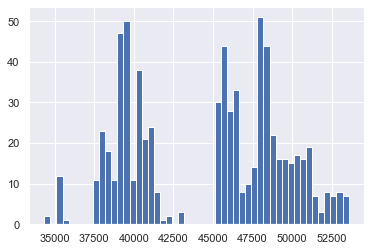

In [48]:
df_gs['employees_on_platform'].hist(bins=50)

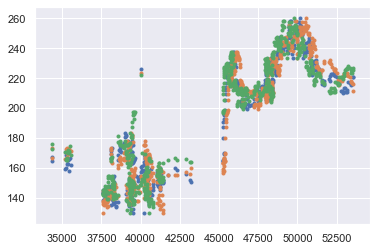

In [49]:
plt.scatter(df_gs['employees_on_platform'], df_gs['Close'], marker='.', label='same-day data')
plt.scatter(df_gs['employees_on_platform'][15:], df_gs['Close'][:-15], marker='.', label='same-day data')
plt.scatter(df_gs['employees_on_platform'][:-15], df_gs['Close'][15:], marker='.', label='same-day data')

In [50]:
# The number of employees tend to vary too much. We will just use companies where this variation is smaller.

In [51]:
# I am only interested in companies that have a ticker.

df_ticker = df2[np.logical_or(pd.isnull(df2['ticker_x'])==False,
                             pd.isnull(df2['ticker_y'])==False)].reset_index()

In [52]:
df_ticker['ticker'] = df_ticker['ticker_x'].combine_first(df_ticker['ticker_y'])

In [53]:
#How long is there data for?

In [54]:
df_ticker.head()

,index,dataset_id,as_of_date,company_name,followers_count,employees_on_platform,link,industry,date_added,date_updated,description,website,entity_id,cusip,isin,short name,ticker_x,company name,ticker_y,ticker
0,6,58400,2015-09-16,McKesson,128090,17520,https://www.linkedin.com/company/1900,Hospital & Health Care,2015-09-16 00:00:00+00:00,2015-09-16 00:00:00+00,NaN,NaN,NaN,NaN,NaN,McKesson,MCK,NaN,NaN,MCK
1,10,58435,2015-09-16,Sanofi,557299,73499,https://www.linkedin.com/company/1642,Pharmaceuticals,2015-09-16 00:00:00+00:00,2015-09-16 00:00:00+00,NaN,NaN,NaN,NaN,NaN,Sanofi,SNY,Sanofi,SNY,SNY
2,16,58403,2015-09-16,Philip Morris International,183040,19151,https://www.linkedin.com/company/1912,Tobacco,2015-09-16 00:00:00+00:00,2015-09-16 00:00:00+00,NaN,NaN,NaN,NaN,NaN,Philip Morris International,PM,NaN,NaN,PM
3,17,58439,2015-09-16,Intel Corporation,635955,102065,https://www.linkedin.com/company/1053,Semiconductors,2015-09-16 00:00:00+00:00,2015-09-16 00:00:00+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Intel Corporation,INTC,INTC
4,18,58440,2015-09-16,ConocoPhillips,420033,18919,https://www.linkedin.com/company/3600,Oil & Energy,2015-09-16 00:00:00+00:00,2015-09-16 00:00:00+00,NaN,NaN,NaN,NaN,NaN,ConocoPhillips,COP,ConocoPhillips,COP,COP


In [55]:
comp_ticker = df_ticker['ticker'].unique()

In [56]:
df_ticker

,index,dataset_id,as_of_date,company_name,followers_count,employees_on_platform,link,industry,date_added,date_updated,description,website,entity_id,cusip,isin,short name,ticker_x,company name,ticker_y,ticker
0,6,58400,2015-09-16,McKesson,128090,17520,https://www.linkedin.com/company/1900,Hospital & Health Care,2015-09-16 00:00:00+00:00,2015-09-16 00:00:00+00,NaN,NaN,NaN,NaN,NaN,McKesson,MCK,NaN,NaN,MCK
1,10,58435,2015-09-16,Sanofi,557299,73499,https://www.linkedin.com/company/1642,Pharmaceuticals,2015-09-16 00:00:00+00:00,2015-09-16 00:00:00+00,NaN,NaN,NaN,NaN,NaN,Sanofi,SNY,Sanofi,SNY,SNY
2,16,58403,2015-09-16,Philip Morris International,183040,19151,https://www.linkedin.com/company/1912,Tobacco,2015-09-16 00:00:00+00:00,2015-09-16 00:00:00+00,NaN,NaN,NaN,NaN,NaN,Philip Morris International,PM,NaN,NaN,PM
3,17,58439,2015-09-16,Intel Corporation,635955,102065,https://www.linkedin.com/company/1053,Semiconductors,2015-09-16 00:00:00+00:00,2015-09-16 00:00:00+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Intel Corporation,INTC,INTC
4,18,58440,2015-09-16,ConocoPhillips,420033,18919,https://www.linkedin.com/company/3600,Oil & Energy,2015-09-16 00:00:00+00:00,2015-09-16 00:00:00+00,NaN,NaN,NaN,NaN,NaN,ConocoPhillips,COP,ConocoPhillips,COP,COP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
861804,2418456,871609,2018-07-17,Louisiana-Pacific Corporation,12192,1128,https://www.linkedin.com/company/204367,Building Materials,2018-07-17 19:20:46.304931+00:00,2018-07-17 19:20:46.304957+00,NaN,http://www.lpcorp.com,NaN,NaN,NaN,NaN,NaN,Louisiana-Pacific Corporation,LPX,LPX
861805,2418462,901659,2018-07-17,Cabot Microelectronics,5028,773,https://www.linkedin.com/company/11374,Semiconductors,2018-07-17 13:51:05.378120+00:00,2018-07-17 13:51:05.378147+00,NaN,http://www.cabotcmp.com,NaN,NaN,NaN,Cabot Microelectronics,CCMP,NaN,NaN,CCMP
861806,2418467,923931,2018-07-17,Macatawa Bank,3127,352,https://www.linkedin.com/company/55981,Banking,2018-07-17 16:32:14.019549+00:00,2018-07-17 16:32:14.019575+00,NaN,http://www.macatawabank.com,NaN,NaN,NaN,Macatawa Bank,MCBC,NaN,NaN,MCBC
861807,2418472,902948,2018-07-17,DMC Global Inc.,1521,184,https://www.linkedin.com/company/586890,Oil & Energy,2018-07-17 13:44:19.302482+00:00,2018-07-17 13:44:19.302508+00,NaN,http://www.dmcglobal.com,NaN,NaN,NaN,NaN,NaN,DMC Global Inc.,BOOM,BOOM


In [57]:
save_tick = []
sd = []

for tick in comp_ticker:
#for tick in range(7):
    df_aux = df_ticker[df_ticker['ticker']==tick]
    df_aux['diff'] = df_aux['employees_on_platform'] - df_aux['employees_on_platform'].shift(7)
    sd.append(np.std(df_aux['diff']))

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [58]:
save_tick = []
sd = []

for tick in comp_ticker:
#for tick in range(7):
    df_aux = df_ticker[df_ticker['ticker']==tick]
    #df_aux['diff'] = df_aux['employees_on_platform'] - df_aux['employees_on_platform'].shift(7)
    sd.append(np.std(df_aux['employees_on_platform']))

In [79]:
df_sd = pd.DataFrame({'STDDEV': sd, 'Tick': comp_ticker})

In [207]:
len(comp_ticker)

1436

In [61]:
# Only choose companies where the standard deviation is smaller than 300
#df_sd = df_sd[np.logical_and(df_sd['STDDEV']>.5, 
 #                   df_sd['STDDEV']<300)].reset_index(drop=True)

In [62]:
tick_anlys = df_sd['Tick']

In [63]:
df_sd.sort_values(by='STDDEV', ascending=False).head(10)['Tick']

364     MAR
11      WMT
7       MCD
77      FDX
6       DIS
28      BAC
488    RLGY
5         F
8      AAPL
70     ORAN
Name: Tick, dtype: object

In [64]:
top10stddev =df_sd.sort_values(by='STDDEV', ascending=False).head(10)['Tick']

In [65]:
df_top10stddev = df_ticker[df_ticker['ticker'].isin(top10stddev)].reset_index(drop=True)

In [66]:
fig = px.scatter(x = df_top10stddev['date_added'], 
              y = df_top10stddev['employees_on_platform'], 
              facet_col=df_top10stddev['company_name'], facet_col_wrap=2)
fig.show()

In [67]:
measures = []
period = []

for tick in comp_ticker:
#for tick in range(7):
    df_aux = df_ticker[df_ticker['ticker']==tick]
#    df_aux['diff'] = 
    period.append((df_aux.date_added.max() - df_aux.date_added.min()).days)
    measures.append(len(df_aux))

In [68]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=period, nbinsx=150))

fig.show()

In [70]:
#Make sure there aren't just 2 measures very spread out.

fig = px.scatter(x = period, 
              y = measures)
fig.show()

In [80]:
df_sd['Period'] = period
df_sd['Measures'] = measures

In [72]:
df_sd = pd.DataFrame({'STDDEV': sd, 'Tick': comp_ticker})

In [73]:
# Only choose companies where the standard deviation is smaller than 300
df_sd = df_sd[np.logical_and(df_sd['STDDEV']>.5, 
                    df_sd['STDDEV']<300)].reset_index(drop=True)

In [74]:
df_sd

,STDDEV,Tick
0,255.467462,BIIB
1,168.383341,FL
2,242.989510,MO
3,252.039853,PSA
4,175.747123,BAM
...,...,...
984,0.999783,BDSI
985,26.163739,SAFM
986,0.610953,WKHS
987,3.669920,ABR


In [81]:
fig = px.scatter(x = df_sd['Period'], 
              y = df_sd['STDDEV'])
fig.show()

In [82]:
# Just choose companies with over 1000 days of observations and stddev < 50. This is a small sample.

In [83]:
sel_comp = df_sd['Tick'][df_sd['Period']>=365*2]

In [84]:
df_sel_comp = df_ticker[df_ticker['ticker'].isin(sel_comp)].reset_index(drop=True)

In [85]:
df_sel_comp

,index,dataset_id,as_of_date,company_name,followers_count,employees_on_platform,link,industry,date_added,date_updated,description,website,entity_id,cusip,isin,short name,ticker_x,company name,ticker_y,ticker
0,6,58400,2015-09-16,McKesson,128090,17520,https://www.linkedin.com/company/1900,Hospital & Health Care,2015-09-16 00:00:00+00:00,2015-09-16 00:00:00+00,NaN,NaN,NaN,NaN,NaN,McKesson,MCK,NaN,NaN,MCK
1,10,58435,2015-09-16,Sanofi,557299,73499,https://www.linkedin.com/company/1642,Pharmaceuticals,2015-09-16 00:00:00+00:00,2015-09-16 00:00:00+00,NaN,NaN,NaN,NaN,NaN,Sanofi,SNY,Sanofi,SNY,SNY
2,16,58403,2015-09-16,Philip Morris International,183040,19151,https://www.linkedin.com/company/1912,Tobacco,2015-09-16 00:00:00+00:00,2015-09-16 00:00:00+00,NaN,NaN,NaN,NaN,NaN,Philip Morris International,PM,NaN,NaN,PM
3,17,58439,2015-09-16,Intel Corporation,635955,102065,https://www.linkedin.com/company/1053,Semiconductors,2015-09-16 00:00:00+00:00,2015-09-16 00:00:00+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Intel Corporation,INTC,INTC
4,18,58440,2015-09-16,ConocoPhillips,420033,18919,https://www.linkedin.com/company/3600,Oil & Energy,2015-09-16 00:00:00+00:00,2015-09-16 00:00:00+00,NaN,NaN,NaN,NaN,NaN,ConocoPhillips,COP,ConocoPhillips,COP,COP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
302290,2418418,60602,2018-07-17,Canadian Solar Inc.,90102,881,https://www.linkedin.com/company/307886,Internet,2018-07-17 14:04:29.860928+00:00,2018-07-17 14:04:29.860982+00,NaN,http://www.canadiansolar.com,NaN,NaN,NaN,NaN,NaN,Canadian Solar Inc.,CSIQ,CSIQ
302291,2418437,58404,2018-07-17,The Walt Disney Company,1430028,112362,https://www.linkedin.com/company/1292,Entertainment,2018-07-17 18:37:22.059611+00:00,2018-07-17 18:37:22.059637+00,NaN,http://www.disneycareers.com,NaN,NaN,NaN,The Walt Disney Company,DIS,The Walt Disney Company,DIS,DIS
302292,2418446,68316,2018-07-17,Lipocine Inc.,538,19,https://www.linkedin.com/company/3281185,Pharmaceuticals,2018-07-17 16:28:34.062442+00:00,2018-07-17 16:28:34.062468+00,NaN,http://www.lipocine.com/,NaN,NaN,NaN,NaN,NaN,Lipocine Inc.,LPCN,LPCN
302293,2418449,90774,2018-07-17,Tiffany & Co.,256070,7984,https://www.linkedin.com/company/166448,Luxury Goods & Jewelry,2018-07-17 20:13:21.640062+00:00,2018-07-17 20:13:21.640111+00,NaN,http://www.tiffany.com,NaN,NaN,NaN,Tiffany & Co.,TIF,Tiffany & Co.,TIF,TIF


In [86]:
#Number of companies to examine

comp_corr = df_sel_comp['company_name'].unique()

In [87]:
def crosscorr(datax, datay, lag=0, wrap=False):
    """ Lag-N cross correlation. 
    Shifted data filled with NaNs 
    
    Parameters
    ----------
    lag : int, default 0
    datax, datay : pandas.Series objects of equal length
    Returns
    ----------
    crosscorr : float
    """
    if wrap:
        shiftedy = datay.shift(lag)
        shiftedy.iloc[:lag] = datay.iloc[-lag:].values
        return datax.corr(shiftedy)
    else: 
        return datax.corr(datay.shift(lag))

In [96]:
df_aux['employees_on_platform'][df_aux.as_of_date.min()]

17520

In [97]:
#
offset = []
max_r = []
tick_corr = []
stddev = []
per = []
meas = []
ratio = []

for comp in comp_corr:
    df_aux = df_sel_comp[df_sel_comp['company_name']==comp]
    df_aux.index = df_aux.as_of_date
    g = yf.Ticker(df_aux['ticker'].iloc[0])
    df_g = g.history(period="6y")
    df_g['Date'] = df_g.index
    df_g = df_g[np.logical_and(df_g.index>=df_aux.as_of_date.min(),
                    df_g.index<=df_aux.as_of_date.max())]
    aux_ratio = df_aux['employees_on_platform'][df_aux.as_of_date.min()]/ \
                    df_aux['employees_on_platform'][df_aux.as_of_date.max()]
    df_merge=pd.merge(df_aux,df_g, how='inner', left_index=True, right_index=True)
    d1 = df_merge['Open']
    d2 = df_merge['employees_on_platform']
    days = 7
    fpd = 30
    rs = [crosscorr(d1,d2, lag) for lag in range(-int(days*fpd),int(days*fpd+1))]
    while (np.ceil(len(rs)/2) < np.argmax(rs)):
        rs[np.argmax(rs)] = -10
    offset.append(np.ceil(len(rs)/2)-np.argmax(rs))
    max_r.append(np.max(rs))
    tick_corr.append(df_aux['ticker'].iloc[0])
    stddev.append(df_sd['STDDEV'][df_sd['Tick']==df_aux['ticker'].iloc[0]].values[0])
    per.append(df_sd['Period'][df_sd['Tick']==df_aux['ticker'].iloc[0]].values[0])
    meas.append(df_sd['Measures'][df_sd['Tick']==df_aux['ticker'].iloc[0]].values[0])
    ratio.append(aux_ratio)

/opt/anaconda3/lib/python3.7/site-packages/numpy/lib/function_base.py:2526: RuntimeWarning:

Degrees of freedom <= 0 for slice

/opt/anaconda3/lib/python3.7/site-packages/numpy/lib/function_base.py:2455: RuntimeWarning:

divide by zero encountered in true_divide



- CELG: No data found, symbol may be delisted
- BBT: No data found, symbol may be delisted
- SYMC: No data found, symbol may be delisted
- RHT: No data found, symbol may be delisted
- S: No data found, symbol may be delisted
- VIA: No data found, symbol may be delisted
- ECA: No data found, symbol may be delisted
- DATA: No data found, symbol may be delisted
- CBPX: No data found, symbol may be delisted
- TMK: No data found, symbol may be delisted
- XON: No data found, symbol may be delisted
- WTR: No data found, symbol may be delisted
- ELLI: No data found, symbol may be delisted
- HRS: No data found, symbol may be delisted
- ORBK: No data found, symbol may be delisted
- KEG: No data found, symbol may be delisted
- PIR: No data found, symbol may be delisted
- DSW: No data found, symbol may be delisted
- INST: No data found, symbol may be delisted


In [98]:
df_corr = pd.DataFrame({'Ticker': tick_corr,
                       'Correlation Max': max_r,
                       'Offset Correlation': offset,
                       'STDDEV': stddev,
                       'Period': per,
                       'Measures': meas,
                       'Employees Ratio': ratio})

In [99]:
df_corr.dropna()[np.logical_and(df_corr['Correlation Max']>0.65, df_corr['Correlation Max']<0.75)]

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



,Ticker,Correlation Max,Offset Correlation,STDDEV,Period,Measures,Employees Ratio
9,TM,0.692983,46.0,2987.742193,1035,1015,0.784322
14,LLY,0.663427,181.0,2750.062280,1035,1018,0.831986
23,COST,0.743058,1.0,5602.492535,1035,1021,0.665941
44,PPG,0.683414,55.0,2066.113081,1034,1015,0.719105
53,ICE,0.680679,1.0,946.377053,1034,1017,0.199459
66,DAL,0.703519,0.0,4621.620422,1034,1017,0.710488
70,ECL,0.731808,208.0,5869.287047,1034,1017,0.776284
75,PSX,0.668039,1.0,826.170971,1034,1016,0.715015
77,INTU,0.683956,56.0,475.736965,1034,1022,0.876628
81,PHM,0.688541,148.0,242.950576,1033,1014,0.692476


In [101]:
fig = px.scatter(x=df_corr['Correlation Max'], 
                 y=df_corr['Offset Correlation'],
                hover_name=df_corr["Ticker"], color=df_corr['Employees Ratio'] , color_continuous_scale="Viridis")#)
fig.update_layout(xaxis = go.layout.XAxis(title_text = "Correlation (Max)"),
                  yaxis = go.layout.YAxis(title_text = "Offset (days)"))
fig.show()

In [192]:
t = 'KMX'
lkd_ge = df_sel_comp[df_sel_comp['ticker']==t]
g = yf.Ticker(t)
df_ge = g.history(period="6y")
df_ge['Date'] = df_ge.index
    
plot_sotck_employees(df_ge, lkd_ge)

In [174]:
to_plot = ['LMT', 'CNC', 'CMI', 'CERN', 'FIVE', 'EFOI', 'EMN']

In [175]:
lkd_ge = df_sel_comp[df_sel_comp['ticker'].isin(to_plot)]

In [179]:
lkd_ge = lkd_ge[['dataset_id', 'as_of_date', 'company_name', 'employees_on_platform', 'industry', 'ticker']]

In [181]:
lkd_ge.to_csv('SelectedCompanies.csv', index=False)

In [176]:
df_gs

,Open,High,Low,Close,Volume,Dividends,Stock Splits,as_of_date,employees_on_platform
Date,,,,,,,,,
2015-09-14,170.678693,170.917785,168.563599,169.152145,2746000,0.0,0,2015-09-14,38124.0
2015-09-15,169.924615,172.904141,169.382052,172.379959,3092800,0.0,0,2015-09-15,38141.0
2015-09-16,172.848995,174.081262,171.589126,173.474319,2717800,0.0,0,2015-09-16,38145.0
2015-09-17,173.299599,175.249171,171.046569,171.460388,3712600,0.0,0,2015-09-17,38143.0
2015-09-18,168.471659,168.637195,166.034711,166.393356,6529900,0.0,0,2015-09-18,38130.0
...,...,...,...,...,...,...,...,...,...
2018-07-11,215.585017,217.007868,215.050258,215.489532,2527000,0.0,0,2018-07-11,53412.0
2018-07-12,217.380317,217.533109,215.594602,216.979248,2223100,0.0,0,2018-07-12,53449.0
2018-07-13,216.415835,218.316137,213.837512,216.205750,2541500,0.0,0,2018-07-13,53484.0


In [186]:
df_corr.to_csv('Correlations.csv', index = False)

In [801]:
def corr_stock_emp(df_ori, c_tick):
    '''
    Returns a dataframe with moving averages for 1 month and 1 week
    '''
    stock = yf.Ticker(c_tick)
    df_stock = stock.history(period="6y")
    df_stock['Date'] = df_stock.index
    
    
    lkd = df_ori[df_ori['ticker']==c_tick]
    df_stock = df_stock[np.logical_and(df_stock.index>=lkd.as_of_date.min(),
                    df_stock.index<=lkd.as_of_date.max())]

    df_stock.drop('Date',axis=1, inplace=True)

    lkd['as_of_date'] = pd.to_datetime(lkd['as_of_date']).shift(-54)

    df_stock = df_stock.reset_index().merge(lkd[['as_of_date', 'employees_on_platform']], 
                                            right_on='as_of_date', left_on='Date', how='left',
                                            left_index=True).set_index('Date')
    df_stock['MAV Open long term'] = df_stock['Open'].rolling(window=30).mean()
    df_stock['MAV Open short term'] = df_stock['Open'].rolling(window=7).mean()
    df_stock['MAV Employees long term'] = df_stock['employees_on_platform'].rolling(window=30).mean()
    df_stock['MAV Employees short term'] = df_stock['employees_on_platform'].rolling(window=7).mean()

    df_stock['Diff Open'] = df_stock['MAV Open long term'] - df_stock['MAV Open short term']
    df_stock['Diff Employees'] = df_stock['MAV Employees long term'] - df_stock['MAV Employees short term']
    
    return df_stock
    


In [802]:
df_stock = corr_stock_emp(df_ticker, 'LMT')

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [803]:
lkd = df_ticker[df_ticker['ticker']=='CERN']

In [804]:
lkd.employees_on_platform.rolling(window=30).mean() - lkd.employees_on_platform.rolling(window=7).mean() 

211              NaN
385              NaN
581              NaN
797              NaN
1027             NaN
             ...    
856331    -85.433333
857149    -88.114286
858165    -94.585714
859261   -101.423810
861201   -105.285714
Name: employees_on_platform, Length: 1019, dtype: float64

In [805]:
df_stock

,Open,High,Low,Close,Volume,Dividends,Stock Splits,as_of_date,employees_on_platform,MAV Open long term,MAV Open short term,MAV Employees long term,MAV Employees short term,Diff Open,Diff Employees
Date,,,,,,,,,,,,,,,
2015-09-16,182.311317,182.794228,181.161117,182.241074,927800,0.0,0,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-09-17,182.495673,184.848750,181.863500,182.276169,958900,0.0,0,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-09-18,180.871357,180.897696,177.929997,178.509491,3010600,0.0,0,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-09-21,179.422638,180.686970,178.404136,179.422638,964700,0.0,0,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-09-22,177.763186,179.088986,176.920285,178.816803,1119200,0.0,0,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-07-11,290.658207,292.121760,288.864201,289.477936,896200,0.0,0,2018-07-11,95729.0,291.143962,284.586912,95259.300000,95620.714286,6.557050,-361.414286
2018-07-12,292.140689,296.927876,291.574153,295.832581,1283300,0.0,0,2018-07-12,95754.0,290.903423,286.641255,95287.766667,95654.000000,4.262168,-366.233333
2018-07-13,296.181912,301.677260,296.030833,300.610291,1662500,0.0,0,2018-07-13,95772.0,290.728428,288.486531,95316.666667,95685.000000,2.241897,-368.333333


Text(0, 0.5, 'Time Series 1')

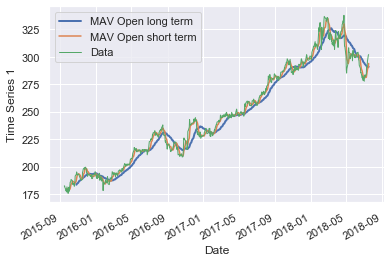

In [806]:
df_stock['MAV Open long term'].plot(grid=True,lw=2)
df_stock['MAV Open short term'].plot(grid=True)
df_stock['Open'].plot(grid=True,lw=1,label='Data')
plt.legend()
plt.ylabel('Time Series 1')

Text(0, 0.5, 'Time Series 1')

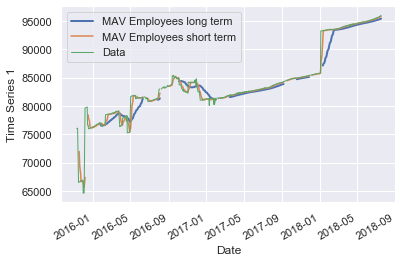

In [807]:
df_stock['MAV Employees long term'].plot(grid=True,lw=2)
df_stock['MAV Employees short term'].plot(grid=True)
df_stock['employees_on_platform'].plot(grid=True,lw=1,label='Data')
plt.legend()
plt.ylabel('Time Series 1')

(-10, 10)

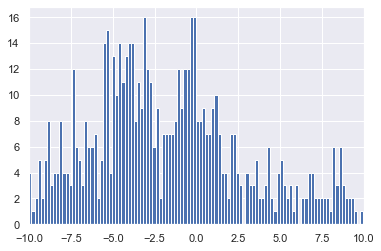

In [808]:
df_stock['Diff Open'].hist(bins=200)
plt.xlim(-10,10)

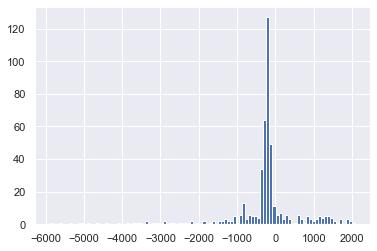

In [809]:
df_stock['Diff Employees'].hist(bins=100)
#plt.xlim(-50,50)

In [810]:
df_stock


,Open,High,Low,Close,Volume,Dividends,Stock Splits,as_of_date,employees_on_platform,MAV Open long term,MAV Open short term,MAV Employees long term,MAV Employees short term,Diff Open,Diff Employees
Date,,,,,,,,,,,,,,,
2015-09-16,182.311317,182.794228,181.161117,182.241074,927800,0.0,0,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-09-17,182.495673,184.848750,181.863500,182.276169,958900,0.0,0,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-09-18,180.871357,180.897696,177.929997,178.509491,3010600,0.0,0,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-09-21,179.422638,180.686970,178.404136,179.422638,964700,0.0,0,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-09-22,177.763186,179.088986,176.920285,178.816803,1119200,0.0,0,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-07-11,290.658207,292.121760,288.864201,289.477936,896200,0.0,0,2018-07-11,95729.0,291.143962,284.586912,95259.300000,95620.714286,6.557050,-361.414286
2018-07-12,292.140689,296.927876,291.574153,295.832581,1283300,0.0,0,2018-07-12,95754.0,290.903423,286.641255,95287.766667,95654.000000,4.262168,-366.233333
2018-07-13,296.181912,301.677260,296.030833,300.610291,1662500,0.0,0,2018-07-13,95772.0,290.728428,288.486531,95316.666667,95685.000000,2.241897,-368.333333


In [862]:
x = 0.2

df_stock['Performance Open 1'] = np.where(df_stock['Diff Open'] >= x, 1, 0)
df_stock['Performance Open 1'] = np.where(df_stock['Diff Open'] < x, -1, df_stock['Performance Open 1'])

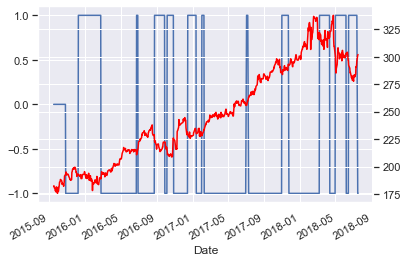

In [863]:
fig, ax = plt.subplots()
ax3 = ax.twinx()

ax1 = df_stock['Performance Open 1'].plot(ax=ax, color='b')
ax2 = df_stock['Open'].plot(ax=ax3, color='red')

In [910]:
x = 50

df_stock['Performance Employees 1'] = np.where(df_stock['Diff Employees'] >= x, 1, 0)
df_stock['Performance Employees 1'] = np.where(df_stock['Diff Employees'] < x, -1, df_stock['Performance Employees 1'])

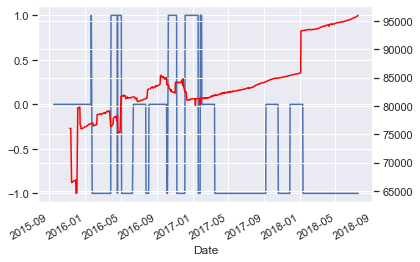

In [911]:
fig, ax = plt.subplots()
ax3 = ax.twinx()

ax1 = df_stock['Performance Employees 1'].plot(ax=ax, color='b')
ax2 = df_stock['employees_on_platform'].plot(ax=ax3, color='red')

In [912]:
df_stock['R_t1'] = np.log(df_stock['Open'] / df_stock['Open'].shift(1))
df_stock['Model Open'] = df_stock['R_t1'] * df_stock['Performance Open 1'].shift(1)
df_stock['R_t2'] = np.log(df_stock['employees_on_platform'] / df_stock['employees_on_platform'].shift(1))
df_stock['Model Employees'] = df_stock['R_t2'] * df_stock['Performance Employees 1'].shift(1)

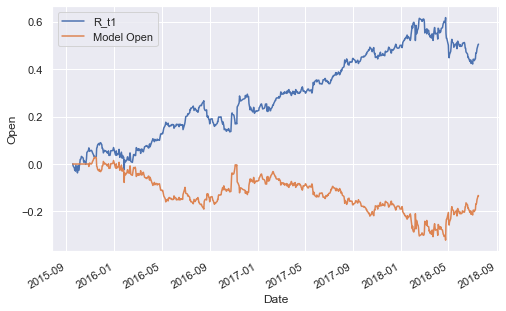

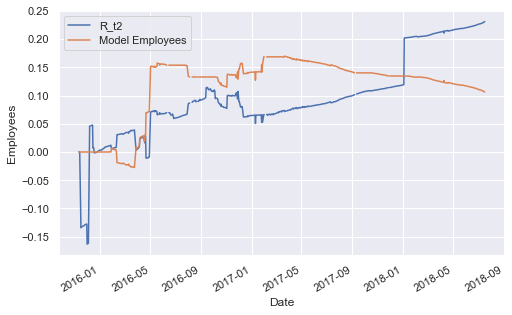

In [913]:
plot1 = df_stock[['R_t1','Model Open']].cumsum().plot(grid=True,figsize=(8,5))

plt.ylabel('Open')
plt.xlabel('Date')
plot2 = df_stock[['R_t2','Model Employees']].cumsum().plot(grid=True,figsize=(8,5))
plt.ylabel('Employees')
plt.xlabel('Date');

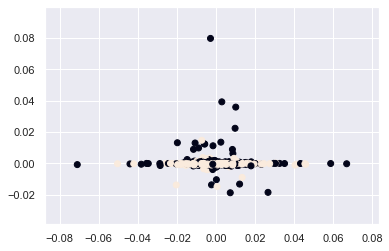

In [914]:
plt.scatter(df_stock['Model Open'], df_stock['Model Employees'], c=df_stock['Performance Open 1'])

In [939]:
df_new = df_stock[['Performance Open 1', 'Performance Employees 1', 'R_t2', 'R_t1', 'Model Employees', 'Model Open']]
#df_new = df_stock[['Performance Open 1', 'Performance Employees 1', 'R_t2', 'Model Employees']]

In [940]:
df_new = df_new.dropna()

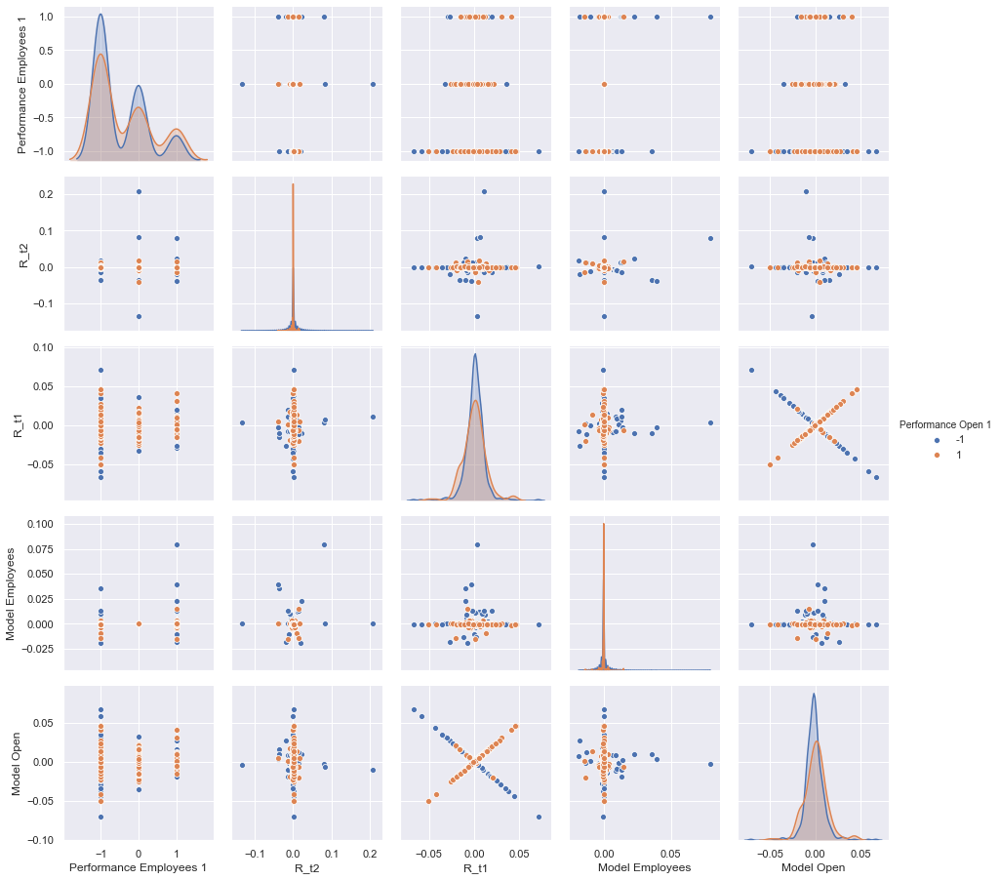

In [941]:
sns.pairplot(df_new, hue='Performance Open 1')

In [942]:
df_new['Performance Open 1'].unique()

array([-1,  1])

In [943]:
X = df_new.drop('Performance Open 1', axis=1)

y = df_new['Performance Open 1']

In [944]:
X = preprocessing.scale(X)

In [945]:
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, test_size=0.2, random_state=None, shuffle=False)

In [946]:
#model = GaussianNB()
#model = svm.LinearSVC()
model = KNeighborsRegressor(n_neighbors=2)


In [947]:
model.fit(Xtrain, ytrain)

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=2, p=2,
                    weights='uniform')

In [948]:
y_model = model.predict(Xtest)

In [949]:
accuracy_score(ytest, y_model)

0.8636363636363636

In [950]:
confusion_matrix(ytest, y_model, normalize='true')

array([[0.91935484, 0.01612903, 0.06451613],
       [0.        , 0.        , 0.        ],
       [0.05714286, 0.12857143, 0.81428571]])